# New York taxis trips

This homework is about New York taxi trips. Here is something from [Todd Schneider](https://toddwschneider.com/posts/analyzing-1-1-billion-nyc-taxi-and-uber-trips-with-a-vengeance/):

> The New York City Taxi & Limousine Commission has released a  detailed historical dataset covering over 1 billion individual taxi trips in the city from January 2009 through December 2019. 
Taken as a whole, the detailed trip-level data is more than just a vast list of taxi pickup and drop off coordinates: it's a story of a City. 
How bad is the rush hour traffic from Midtown to JFK? 
Where does the Bridge and Tunnel crowd hang out on Saturday nights?
What time do investment bankers get to work? How has Uber changed the landscape for taxis?
The dataset addresses all of these questions and many more.

The NY taxi trips dataset has been plowed by series of distinguished data scientists.
The dataset is available from on Amazon S3 (Amazon's cloud storage service).
The link for each file has the following form:

    https://s3.amazonaws.com/nyc-tlc/trip+data/yellow_tripdata_{year}-{month}.csv

There is one CSV file for each NY taxi service (`yellow`, `green`, `fhv`) and each calendar month (replacing `{year}` and `{month}` by the desired ones).
Each file is moderately large, a few gigabytes. 
The full dataset is relatively large if it has to be handled on a laptop (several hundred gigabytes).

You will focus on the `yellow` taxi service and a pair of months, from year 2015 and from year 2018. 
Between those two years, for hire vehicles services have taken off and carved a huge marketshare.

Whatever the framework you use, `CSV` files prove hard to handle. 
After downloading the appropriate files (this takes time, but this is routine), a first step will consist in converting the csv files into a more Spark friendly format such as `parquet`.

Saving into one of those formats require decisions about bucketing, partitioning and so on. Such decisions influence performance. It is your call.
Many people have been working on this dataset, to cite but a few:


- [1 billion trips with a vengeance](https://toddwschneider.com/posts/analyzing-1-1-billion-nyc-taxi-and-uber-trips-with-a-vengeance/)
- [1 billion trips with R and SQL ](http://freerangestats.info/blog/2019/12/22/nyc-taxis-sql)
- [1 billion trips with redshift](https://tech.marksblogg.com/billion-nyc-taxi-rides-redshift.html)
- [nyc-taxi](https://github.com/fmaletski/nyc-taxi-map)

Depending on your internet connection, **download the files** corresponding to **"yellow" taxis** for the years 2015 and 2018. Download **at least one month** (the same) for 2015 and 2018, if you can download all of them.

**Hint.** The 12 csv for 2015 are about 23GB in total, but the corresponding parquet file, if you can create it for all 12 months, is only about 3GB.

You **might** need the following stuff in order to work with GPS coordinates and to plot things easily.

In [1]:
#!yes | apt-get install libproj-dev proj-data proj-bin  
#!yes | apt-get install libgeos-dev

In [2]:
!pip install shapely --no-binary shapely

You should consider upgrading via the '/usr/bin/python3 -m pip install --upgrade pip' command.


In [3]:
!pip install geojson geopandas plotly geopy descartes geoplot proj geos mplleaflet folium fiona plotly.express

  Using cached plotly_express-0.4.1-py2.py3-none-any.whl (2.9 kB)
You should consider upgrading via the '/usr/bin/python3 -m pip install --upgrade pip' command.


In [4]:
!pip install ipyleaflet ipywidgets

You should consider upgrading via the '/usr/bin/python3 -m pip install --upgrade pip' command.


For this homework **we will let you decide on the tools to use** (expected for Spark) and to **find out information all by yourself** (but don't hesitate to ask questions on the `slack` channel).

# Loading data as parquet files

We want to organize the data on a per year and per service basis. 
We want to end up with one `parquet` file for each year and each taxi service, since parquet is much better than CSV files.

**Hint.** Depending on your internet connection and your laptop, you can use only the "yellow" service and use one month of 2015 and 2018

CSV files can contain corrupted lines. You may have to work in order to perform ETL (Extract-Transform-Load) in order obtain a properly typed data frame.

You are invited to proceed as follows:

1. Try to read the CSV file without imposing a schema. 
1. Inspect the inferred schema. Do you agree with Spark's typing decision?
1. Eventually correct the schema and read again the data
1. Save the data into parquet files
1. In the rest of your work, **you will only use the parquet files you created**, not the csv files (don't forget to choose a partitioning column and a number of partitions when creating the parquet files).

**Hint.** Don't forget to ask `Spark` to use all the memory and ressources from your computer.

**Hint.** Don't forget that you should specify a partitioning column and a number of partitions when creating the parquet files.

**Hint.** Note that the schemas of the 2015 and 2018 data are different...

**Hint.** When working on this, ask you and answer to the following questions:  __IDK__

1. What is the `StorageLevel` of the dataframe after reading the csv files?
1. What is the number of partitions of the dataframe? 
1. Is it possible to tune this number at loading time? 
1. Why would we want to modify the number of partitions when creating the parquet files?

In [5]:
# import the usual suspects
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
from pathlib import Path
import sys
import timeit

%matplotlib inline
import seaborn as sns

sns.set_context("notebook", font_scale=1.2)
# spark
from pyspark import SparkConf, SparkContext
from pyspark.sql import SparkSession
from pyspark.sql import Window
from pyspark.sql.functions import col
import pyspark.sql.functions as fn
from pyspark.sql.catalog import Catalog
from pyspark.sql.types import StructType, StructField
from pyspark.sql.types import IntegerType, StringType
from pyspark.sql.functions import broadcast
from pyspark.sql import DataFrame

import geopandas as gpd
from shapely.geometry import Point, Polygon
from pyproj import CRS

### Config

In the next cell are the config dicts that will be used to configure spark, to know if the CSV files will be downloaded and if the parquet files will be created. 

This is to avoid any repeated unnecessary steps.

In [6]:
# overall default config
default_global_config = {
    "check_csv": False,
    "gen_parquet" : False,
    "delete_dataframes_after_use": True
}

# global config to generate all parquet files and read from CSV
new_global_config = {
    "check_csv": True,
    "gen_parquet" : True,
    "delete_dataframes_after_use": True
}

# Change next lint to change global config
#global_config = default_global_config
global_config = new_global_config

# Default spark config
spark_config_default = {
    "partitions": 4, # Nb of processor cores
    "memory": "4G"
}

# Change next line to change spark config
spark_config = spark_config_default

In [7]:
pyspark_submit_args = ' --driver-memory ' + spark_config["memory"] + ' pyspark-shell'
os.environ["PYSPARK_SUBMIT_ARGS"] = pyspark_submit_args

In [8]:
conf = SparkConf().setAppName("Spark Session HMW3")
conf.set('spark.driver.memory', spark_config["memory"])
#conf.set("spark.driver.maxResultSize","0")
conf.set("spark.sql.shuffle.partitions", spark_config["partitions"] * 2)

sc = SparkContext(conf=conf)

spark = (SparkSession
    .builder
    .appName("Spark Taxi")
    .getOrCreate()
)

In [9]:
sc._conf.getAll()

[('spark.driver.host', '9d464c10cabe'),
 ('spark.driver.port', '32785'),
 ('spark.rdd.compress', 'True'),
 ('spark.app.id', 'local-1591480469280'),
 ('spark.app.name', 'Spark Taxi'),
 ('spark.serializer.objectStreamReset', '100'),
 ('spark.master', 'local[*]'),
 ('spark.executor.id', 'driver'),
 ('spark.submit.deployMode', 'client'),
 ('spark.driver.memory', '4G'),
 ('spark.sql.shuffle.partitions', '8'),
 ('spark.ui.showConsoleProgress', 'true')]

In [10]:
sc.setLogLevel("INFO")

In [11]:
import requests, zipfile, io
from pathlib import Path

data_path = './data/'
base_csv = 'yellow_tripdata_{}-{}.csv'
base_url = 'https://s3.amazonaws.com/nyc-tlc/trip+data/'

years = [2015, 2018]
month = '01'

def download_file(url, path):
    with requests.get(url, stream=True) as r:
        r.raise_for_status()
        with open(path, 'wb') as f:
            for chunk in r.iter_content(chunk_size=8192): 
                f.write(chunk)

if global_config["check_csv"]:
    for year in years:
        s = "".join([data_path, base_csv.format(year, month)])
        path = Path(s)
        print(path)
        if not path.exists():
            url = s
            download_file(url, path)

path = Path(data_path + "xkcd_coordinates_.png")

if not path.exists():
    url = "https://imgs.xkcd.com/comics/coordinate_precision.png"
    download_file(url, path)

In [12]:
#1
if global_config["gen_parquet"]:
    df_2015 = (spark.read
        .format('csv')
        .option('header', 'true')
        .option("sep", ",")
        .option("mode", "DROPMALFORMED")
        .option("inferschema", "true")
        .load('data/yellow_tripdata_2015-01.csv')
    )
    
    arr = 4
    
    df_2015 = df_2015 \
        .withColumn("pickup_longitude", fn.round(df_2015.pickup_longitude, arr)) \
        .withColumn("pickup_latitude", fn.round(df_2015.pickup_latitude, arr)) \
        .withColumn("dropoff_longitude", fn.round(df_2015.dropoff_longitude, arr)) \
        .withColumn("dropoff_latitude", fn.round(df_2015.dropoff_latitude, arr))
    df_2015.printSchema()

In [13]:
if global_config["gen_parquet"]:
    df_2018 = (spark.read
        .format('csv')
        .option('header', 'true')
        .option("sep", ",")
        .option("mode", "DROPMALFORMED")
        .option("inferschema", "true")
        .load('data/yellow_tripdata_2018-01.csv')
    )
    df_2018.printSchema()

2. We will round the coordinate of the 2015 dataset, as indicated in this XKCD it is not necessery to have more than 10^-arr precision :

![](./data/xkcd_coordinates_.png)

 
We notice that between 2015 and 2018, the columns pickup_longitude, pickup_latitude, dropoff_longitude and dropoff_latitude have been replaced by PULocationID and DOLocationID.

In [14]:
#3
base_pqt = 'yellow_tripdata_{}-{}.parquet'

if global_config["gen_parquet"]:
    path_2015 = "".join([data_path, base_pqt.format(2015, "01")])
    path_2018 = "".join([data_path, base_pqt.format(2018, "01")])
    path = Path(path_2015)
    if not path.exists():
        df_2015.write.parquet(path_2015)
    path = Path(path_2018)
    if not path.exists():
        df_2018.write.parquet(path_2018)


In [15]:
if global_config["check_csv"]:
    # Drop the csv data-frames
    spark.catalog.clearCache()

In [16]:
pqt2015 = spark.read.parquet("".join([data_path, base_pqt.format(2015, "01")]))
pqt2015.printSchema()

root
 |-- VendorID: integer (nullable = true)
 |-- tpep_pickup_datetime: timestamp (nullable = true)
 |-- tpep_dropoff_datetime: timestamp (nullable = true)
 |-- passenger_count: integer (nullable = true)
 |-- trip_distance: double (nullable = true)
 |-- pickup_longitude: double (nullable = true)
 |-- pickup_latitude: double (nullable = true)
 |-- RateCodeID: integer (nullable = true)
 |-- store_and_fwd_flag: string (nullable = true)
 |-- dropoff_longitude: double (nullable = true)
 |-- dropoff_latitude: double (nullable = true)
 |-- payment_type: integer (nullable = true)
 |-- fare_amount: double (nullable = true)
 |-- extra: double (nullable = true)
 |-- mta_tax: double (nullable = true)
 |-- tip_amount: double (nullable = true)
 |-- tolls_amount: double (nullable = true)
 |-- improvement_surcharge: double (nullable = true)
 |-- total_amount: double (nullable = true)



In [17]:
pqt2018 = spark.read.parquet("".join([data_path, base_pqt.format(2018, "01")]))
pqt2018.printSchema()
pqt2018.createOrReplaceTempView("pqt2018")

root
 |-- VendorID: integer (nullable = true)
 |-- tpep_pickup_datetime: timestamp (nullable = true)
 |-- tpep_dropoff_datetime: timestamp (nullable = true)
 |-- passenger_count: integer (nullable = true)
 |-- trip_distance: double (nullable = true)
 |-- RatecodeID: integer (nullable = true)
 |-- store_and_fwd_flag: string (nullable = true)
 |-- PULocationID: integer (nullable = true)
 |-- DOLocationID: integer (nullable = true)
 |-- payment_type: integer (nullable = true)
 |-- fare_amount: double (nullable = true)
 |-- extra: double (nullable = true)
 |-- mta_tax: double (nullable = true)
 |-- tip_amount: double (nullable = true)
 |-- tolls_amount: double (nullable = true)
 |-- improvement_surcharge: double (nullable = true)
 |-- total_amount: double (nullable = true)



In [18]:
pqt2015.head(3)

[Row(VendorID=1, tpep_pickup_datetime=datetime.datetime(2015, 1, 13, 11, 46, 19), tpep_dropoff_datetime=datetime.datetime(2015, 1, 13, 12, 8, 42), passenger_count=2, trip_distance=2.6, pickup_longitude=-74.0054, pickup_latitude=40.737, RateCodeID=1, store_and_fwd_flag='N', dropoff_longitude=-73.9772, dropoff_latitude=40.7586, payment_type=1, fare_amount=14.5, extra=0.0, mta_tax=0.5, tip_amount=1.0, tolls_amount=0.0, improvement_surcharge=0.3, total_amount=16.3),
 Row(VendorID=1, tpep_pickup_datetime=datetime.datetime(2015, 1, 13, 11, 46, 19), tpep_dropoff_datetime=datetime.datetime(2015, 1, 13, 11, 55, 48), passenger_count=1, trip_distance=0.4, pickup_longitude=-73.9961, pickup_latitude=40.7485, RateCodeID=1, store_and_fwd_flag='N', dropoff_longitude=-73.9922, dropoff_latitude=40.7541, payment_type=1, fare_amount=7.0, extra=0.0, mta_tax=0.5, tip_amount=1.9, tolls_amount=0.0, improvement_surcharge=0.3, total_amount=9.7),
 Row(VendorID=1, tpep_pickup_datetime=datetime.datetime(2015, 1, 1

# Investigate (at least) one month of data in 2015

From now on, you will be using **the parquet files you created for 2015**.

We shall visualize several features of taxi traffic during one calendar month
in 2015 and the same calendar month in 2018.

**Hint.** In order to build appealing graphics, you may stick to `matplotlib + seaborn`, you can use also
`plotly`, which is used a lot to build interactive graphics, but you can use whatever you want.

The following longitudes and lattitudes encompass Newark and JFK airports, Northern Manhattan and Verazzano bridge.

In [19]:
lon_min_ = -74.10
lon_max_ = -73.70
lat_min_ = 40.58
lat_max_ = 40.90

lon_min = -74.29504394531249
lon_max = -73.74298095703125
lat_min = 40.48038142908172
lat_max = 40.901057866884024

1. Using these boundaries, **filter the 2015 data** (using pickup and dropoff longitude and latitude) and count the number of trips for each value of `passenger_count` and make a plot of that.

In [20]:
pqt2015.createOrReplaceTempView("pqt2015")

pqt2015F = spark.sql(
    """SELECT * FROM pqt2015 
    WHERE pqt2015.pickup_longitude >= {lon_min} 
    AND pqt2015.pickup_longitude <= {lon_max} 
    AND pqt2015.pickup_latitude >= {lat_min} 
    AND pqt2015.pickup_latitude <= {lat_max}
    AND pqt2015.dropoff_longitude >= {lon_min} 
    AND pqt2015.dropoff_longitude <= {lon_max} 
    AND pqt2015.dropoff_latitude >= {lat_min} 
    AND pqt2015.dropoff_latitude <= {lat_max}""" \
                        .format(lon_min = lon_min, \
                                lon_max = lon_max, \
                                lat_max = lat_max, \
                                lat_min = lat_min))

In [21]:
pqt2015F.createOrReplaceTempView("pqt2015F")

In [22]:
passengerCount = spark.sql(
    """SELECT COUNT(*) AS count, query.passenger_count
    FROM (
    SELECT DISTINCT(passenger_count) FROM pqt2015F
    ) AS query, pqt2015
    WHERE pqt2015.passenger_count = query.passenger_count
    GROUP BY query.passenger_count""")


In [23]:
#passengerCount.orderBy("passenger_count").collect()

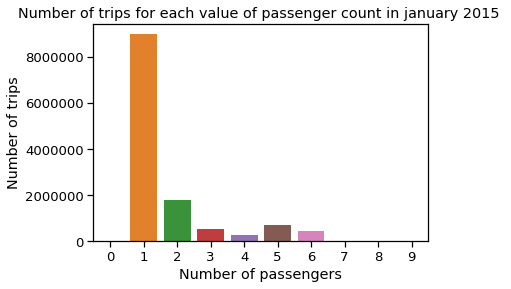

In [24]:
ax = sns.barplot(data = passengerCount.toPandas(), x = "passenger_count",  y = "count")
ax.set_ylabel("Number of trips")
ax.set_xlabel("Number of passengers")
ax.set_title("Number of trips for each value of passenger count in january 2015 ")
#ax.set_yscale('log')
ax

In [25]:
if global_config["delete_dataframes_after_use"]:
    passengerCount.unpersist()
    #pqt2015.unpersist()

Trips with $0$ or larger than $7$ passengers are pretty rare.
We suspect these to be outliers. 
We need to explore these trips further in order order to understand what might be wrong
with them

1. What's special with trips with zero passengers?
1. What's special with trips with more than $6$ passengers?
1. What is the largest distance travelled during this month? Is it the first taxi on the moon?
1. Plot the distribution of the `trip_distance` (using an histogram for instance) during year 2015. Focus on trips with non-zero trip distance and trip distance less than 30 miles.

In [26]:
nybb = gpd.read_file("https://s3.amazonaws.com/nyc-tlc/misc/taxi_zones.zip").to_crs("EPSG:4326")

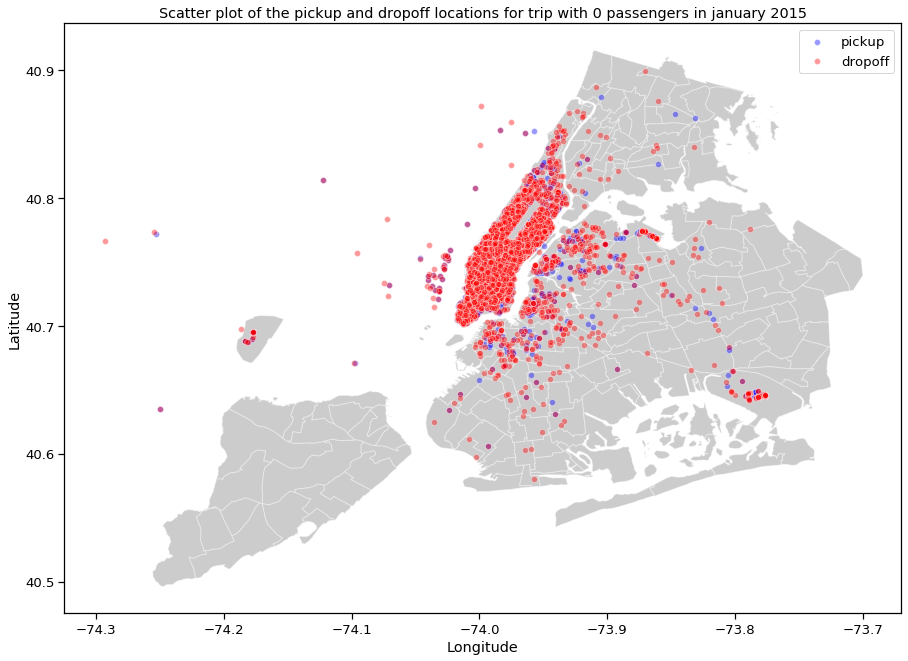

In [78]:
df_lot = spark.sql(
    """SELECT * FROM pqt2015F
    WHERE passenger_count = 0""")
fig, ax = plt.subplots(figsize = (15, 12))
nybb.plot(ax = ax, \
    color='gray', edgecolor='white', alpha = 0.4)

# We can now plot our ``GeoDataFrame``.
sns.scatterplot(ax=ax, data = df_lot.toPandas(),\
                                             x = "pickup_longitude", y = "pickup_latitude",\
                                             color='blue', alpha = 0.4)
sns.scatterplot(ax=ax, data = df_lot.toPandas(),\
                                             x = "dropoff_longitude", y = "dropoff_latitude",\
                                             color='red', alpha = 0.4)
ax.set_title("Scatter plot of the pickup and dropoff locations for trip with 0 passengers in january 2015")
ax.set_ylabel("Latitude")
ax.set_xlabel("Longitude")
plt.legend(labels=['pickup', 'dropoff'])
plt.show()

Text(0.5, 1.0, 'Trip count with 0 passengers by total fare amount.')

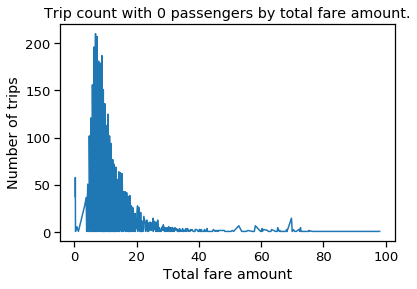

In [82]:
g = sns.lineplot(data=df_lot.where((col("total_amount") < 100) & (col("total_amount") >= 0)).groupBy("total_amount").count().toPandas(), x = "total_amount", y = "count")
g.set_ylabel("Number of trips")
g.set_xlabel("Total fare amount")
g.set_title("Trip count with 0 passengers by total fare amount.")

1. We notice that the data for these trips look perfectly normal and we therefore conclude that trips with 0 passengers are due to input errors of the passenger count as it is manually registered by the driver, as stated [here](https://www1.nyc.gov/assets/tlc/downloads/pdf/data_dictionary_trip_records_yellow.pdf).

Text(0.5, 1.0, 'Number of trips in fonction of the distance for 7 + passenger trips in january 2015')

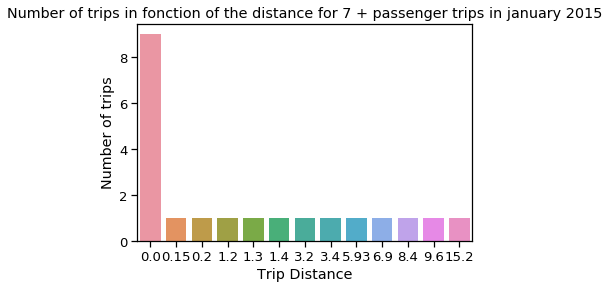

In [28]:
#2
df_lot = spark.sql(
    """SELECT * FROM pqt2015F
    WHERE passenger_count > 6""")
g = sns.barplot(data = df_lot.groupby("trip_distance").count().toPandas(), x = "trip_distance", y = "count")
g.set_xlabel("Trip Distance")
g.set_ylabel("Number of trips")
g.set_title("Number of trips in fonction of the distance for 7 + passenger trips in january 2015")


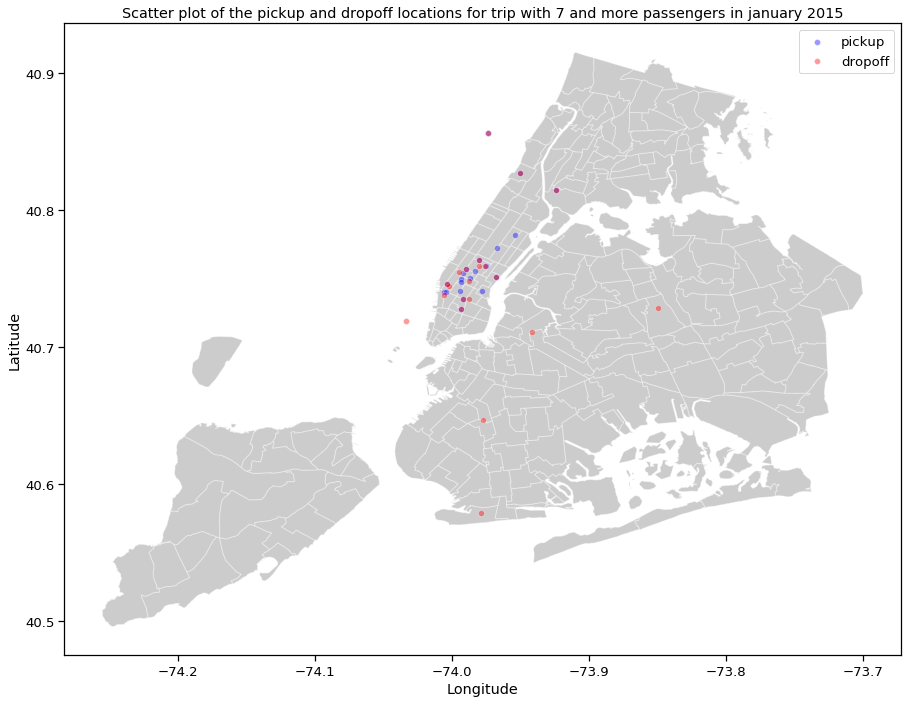

In [29]:
fig, ax = plt.subplots(figsize = (15, 12))
nybb.plot(ax = ax, \
    color='gray', edgecolor='white', alpha = 0.4)

# We can now plot our ``GeoDataFrame``.
sns.scatterplot(ax=ax, data = df_lot.toPandas(),\
                                             x = "pickup_longitude", y = "pickup_latitude",\
                                             color='blue', alpha = 0.4)
sns.scatterplot(ax=ax, data = df_lot.toPandas(),\
                                             x = "dropoff_longitude", y = "dropoff_latitude",\
                                             color='red', alpha = 0.4)
ax.set_title("Scatter plot of the pickup and dropoff locations for trip with 7 and more passengers in january 2015")
ax.set_ylabel("Latitude")
ax.set_xlabel("Longitude")
plt.legend(labels=['pickup', 'dropoff'])
plt.show()

2. We notice that the trips distance are once again mostly short and concentrated in Manhattan. Furthermore ther aren't as represented as trips with fewer passenger because an "usual" taxi can not take as much people. For trips with a distance of 0, we can conclude that they are also input errors.

In [30]:
#3
big_trip = spark.sql(
    """SELECT MAX(trip_distance)
    FROM pqt2015F
    """
)
big_trip.show()

+------------------+
|max(trip_distance)|
+------------------+
|      1.54200045E7|
+------------------+



3.The largest distance travelled during this month is 1.54200045E7 miles.

In [31]:
#4
tripDistance = spark.sql(
    """SELECT COUNT(*) AS count, query.trip_distance
    FROM (
    SELECT DISTINCT(trip_distance) FROM pqt2015F 
    WHERE trip_distance > 0 
    AND trip_distance < 30
    ) AS query, pqt2015F
    WHERE pqt2015F.trip_distance = query.trip_distance
    GROUP BY query.trip_distance""")

Text(0.5, 1.0, 'Number of trips as a function of distance for trips > 0 and < 30 miles')

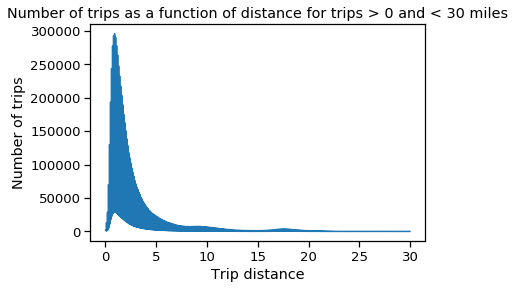

In [32]:
g = sns.lineplot(data=tripDistance.toPandas(), x = "trip_distance", y = "count")
g.set_ylabel("Number of trips")
g.set_xlabel("Trip distance")
g.set_title("Number of trips as a function of distance for trips > 0 and < 30 miles")

In [33]:
if global_config["delete_dataframes_after_use"]:
    tripDistance.unpersist()

Let's look at what Spark does for these computations

1. Use the `explain` method or have a look at the [Spark UI](http://localhost:4040/SQL/) to analyze the job. You should be able to assess 
    - Parsed Logical Plan
    - Analyzed Logical Plan
    - Optimized Logical Plan
    - Physical Plan
1. Do the Analyzed Logical Plan and Optimized Logical Plan differ? Spot the differences if any. How would a RDBMS proceed with such a query?
1. How does the physical plan differ from the Optimized Logical Plan? What are the keywords you would not expects in a RDBMS? What is their meaning? 
1. Inspect the stages on [Spark UI](http://localhost:4040/stages/stage). How many *stages* are necessary to complete the Spark job? What are the roles of `HashAggregate` and `Exchange hashpartitioning`?
1. Does the physical plan perform `shuffle` operations? If yes how many?
1. What are tasks with respect to stages (in Spark language)? How many tasks are your stages made of?

In [34]:
#1 
tripDistance.explain(extended = 'true')
tripDistance.collect()

== Parsed Logical Plan ==
'Aggregate ['query.trip_distance], ['COUNT(1) AS count#188, 'query.trip_distance]
+- 'Filter ('pqt2015F.trip_distance = 'query.trip_distance)
   +- 'Join Inner
      :- 'SubqueryAlias `query`
      :  +- 'Distinct
      :     +- 'Project ['trip_distance]
      :        +- 'Filter (('trip_distance > 0) && ('trip_distance < 30))
      :           +- 'UnresolvedRelation `pqt2015F`
      +- 'UnresolvedRelation `pqt2015F`

== Analyzed Logical Plan ==
count: bigint, trip_distance: double
Aggregate [trip_distance#4], [count(1) AS count#188L, trip_distance#4]
+- Filter (trip_distance#194 = trip_distance#4)
   +- Join Inner
      :- SubqueryAlias `query`
      :  +- Distinct
      :     +- Project [trip_distance#4]
      :        +- Filter ((trip_distance#4 > cast(0 as double)) && (trip_distance#4 < cast(30 as double)))
      :           +- SubqueryAlias `pqt2015f`
      :              +- Project [VendorID#0, tpep_pickup_datetime#1, tpep_dropoff_datetime#2, passenger_c

[Row(count=6975, trip_distance=0.34),
 Row(count=19694, trip_distance=0.54),
 Row(count=21082, trip_distance=0.57),
 Row(count=25205, trip_distance=0.66),
 Row(count=27342, trip_distance=0.73),
 Row(count=28945, trip_distance=0.91),
 Row(count=29104, trip_distance=0.92),
 Row(count=28911, trip_distance=1.01),
 Row(count=277510, trip_distance=1.1),
 Row(count=27193, trip_distance=1.12),
 Row(count=25895, trip_distance=1.23),
 Row(count=24799, trip_distance=1.31),
 Row(count=24205, trip_distance=1.34),
 Row(count=232341, trip_distance=1.4),
 Row(count=22738, trip_distance=1.45),
 Row(count=20139, trip_distance=1.63),
 Row(count=18416, trip_distance=1.75),
 Row(count=17042, trip_distance=1.86),
 Row(count=16748, trip_distance=1.88),
 Row(count=14919, trip_distance=2.04),
 Row(count=14734, trip_distance=2.06),
 Row(count=14510, trip_distance=2.08),
 Row(count=10915, trip_distance=2.42),
 Row(count=102002, trip_distance=2.5),
 Row(count=8862, trip_distance=2.73),
 Row(count=8539, trip_dista

In [35]:
big_trip.explain(extended = 'true')
big_trip.collect()

== Parsed Logical Plan ==
'Project [unresolvedalias('MAX('trip_distance), None)]
+- 'UnresolvedRelation `pqt2015F`

== Analyzed Logical Plan ==
max(trip_distance): double
Aggregate [max(trip_distance#4) AS max(trip_distance)#180]
+- SubqueryAlias `pqt2015f`
   +- Project [VendorID#0, tpep_pickup_datetime#1, tpep_dropoff_datetime#2, passenger_count#3, trip_distance#4, pickup_longitude#5, pickup_latitude#6, RateCodeID#7, store_and_fwd_flag#8, dropoff_longitude#9, dropoff_latitude#10, payment_type#11, fare_amount#12, extra#13, mta_tax#14, tip_amount#15, tolls_amount#16, improvement_surcharge#17, total_amount#18]
      +- Filter ((((pickup_longitude#5 >= cast(-74.29504394531249 as double)) && (pickup_longitude#5 <= cast(-73.74298095703125 as double))) && ((pickup_latitude#6 >= cast(40.48038142908172 as double)) && (pickup_latitude#6 <= cast(40.901057866884024 as double)))) && (((dropoff_longitude#9 >= cast(-74.29504394531249 as double)) && (dropoff_longitude#9 <= cast(-73.74298095703125 as

[Row(max(trip_distance)=15420004.5)]

![](Spark_query2.png)

2. We can see that the Optimized Logical Plan Spark does optimization itself, and when there is no need of multiple filters do the same task with only one filter using and operator. For the first query we can see that there are 4 __Filter__ in the  Analyzed Logical Plan  and only 2 in the Optimized Logical Plan.

3. Physical Plan is generated once our Optimized Logical Plan is created.  The physical plan has one more step, the __FileScan parquet__, and the __Aggregate action__ in the Optimized Logical Plan is  an __HashAggregate__ action in the Physical Plan. The Physical Plan is responsible for deciding the type of join, sequence of the execution of filter, where, groupBy clause, etc.

4. 3 stages are necessary for the first query, and 2 for the second.
The HashAggregate aggregate all values for a given hash-key together.
Exchange hashpartitioning correspond to Hash Partitioning which is is a partitioning in which rows are distributed across partitions based on the MurMur3 hash of partitioning expressions.

5. The physical plan does perform shuffle operations during the __Exchange__ and __Exchange hashpartitioning__ parts, so once for the second query and twice for the first one. 

6. Tasks correspond to the state of execution of a partition. Our stages are made of 8 tasks as  our RDD has 8 partitions.


Now, compute the following and produce relevant plots:

1. Break down the trip distance distribution for each day of week
1. Count the number of distinct pickup location

1. Compute and display tips and profits as a function of the pickup location

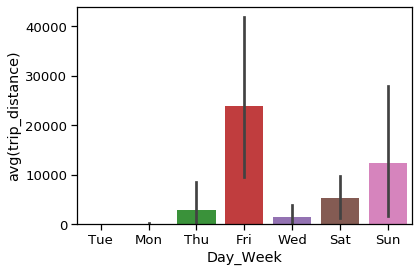

In [36]:
#1
pqtBreak = pqt2015F
pqtBreak = pqtBreak.select("tpep_pickup_datetime", "trip_distance")
pqtBreak = pqtBreak.withColumn("Day_Week", fn.date_format(pqtBreak.tpep_pickup_datetime, 'E'))

sns.barplot(data = pqtBreak.groupBy("trip_distance","Day_Week").avg("trip_distance").toPandas(), x = "Day_Week",
            y = "avg(trip_distance)")

In [37]:
#2
Pck = spark.sql(
    """
    SELECT COUNT(*) 
    FROM pqt2015F, (SELECT DISTINCT(pickup_longitude) as a FROM pqt2015F) AS Long, 
    (SELECT DISTINCT(pickup_latitude) as b FROM pqt2015F) AS Lat
    WHERE pqt2015F.pickup_longitude  = a
    AND pqt2015F.pickup_latitude = b
    """)
Pck.head(2)

[Row(count(1)=12467089)]

In [38]:
#3
Pck_TE= pqt2015F.select("pickup_longitude","pickup_latitude","tip_amount","total_amount")\
                 .groupBy("pickup_longitude","pickup_latitude")\
                 .avg("tip_amount", "total_amount")

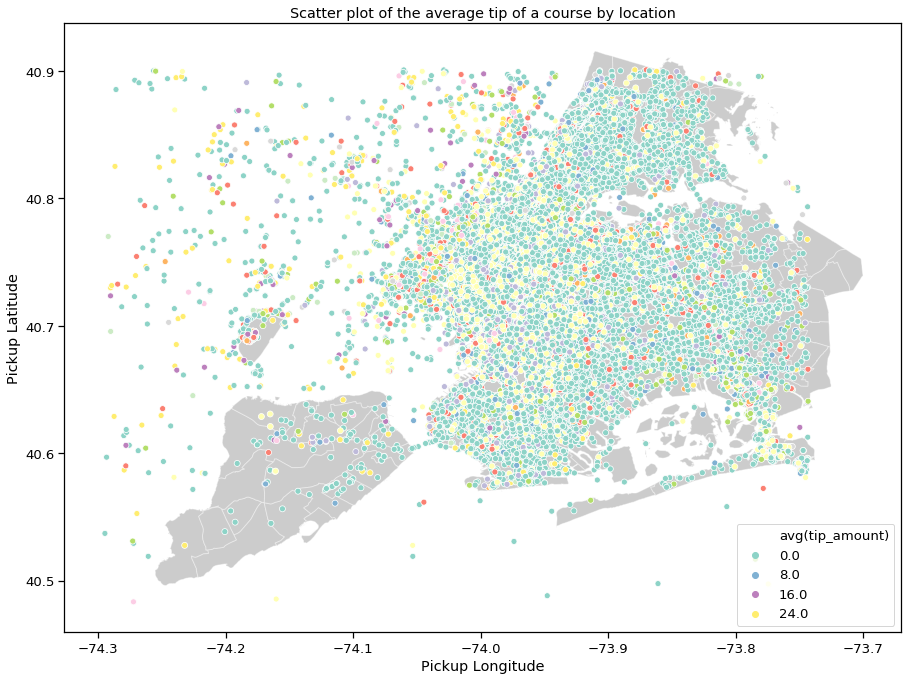

In [39]:
fig, ax = plt.subplots(figsize = (15, 12))
nybb.plot(ax = ax, \
    color='gray', edgecolor='white', alpha = 0.4)
sns.scatterplot(data = Pck_TE.toPandas(), x = "pickup_longitude",\
                y = "pickup_latitude", palette="Set3", hue="avg(tip_amount)",\
                hue_norm=(0, 20))
ax.set_title("Scatter plot of the average tip of a course by location")
ax.set_ylabel("Pickup Latitude")
ax.set_xlabel("Pickup Longitude")
plt.show()

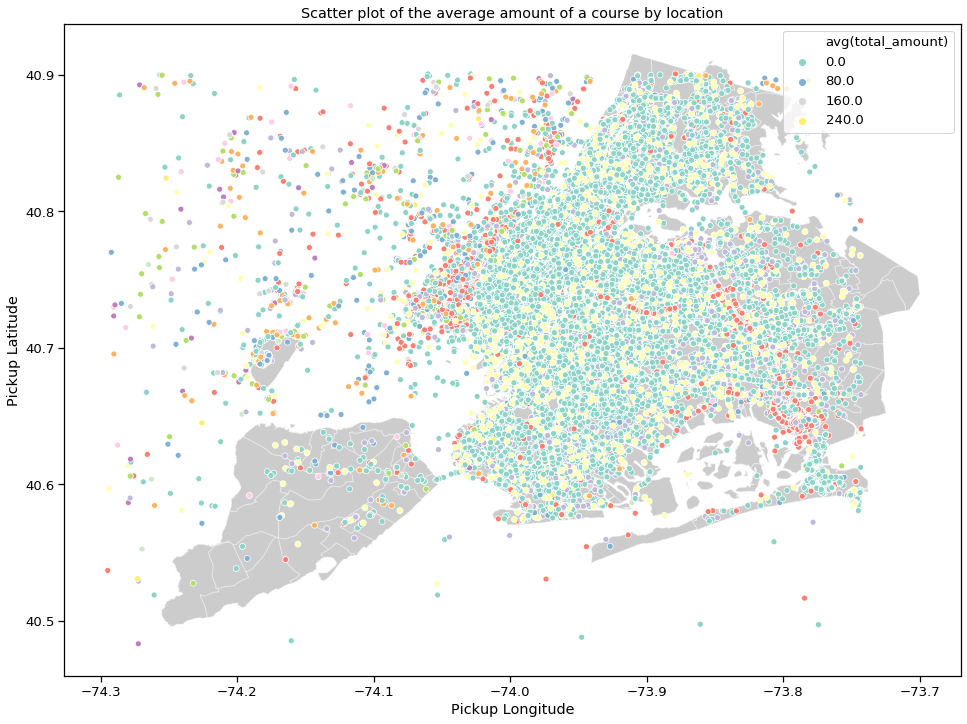

In [40]:
fig, ax = plt.subplots(figsize = (20, 12))
nybb.plot(ax = ax,   color='gray', edgecolor='white', alpha = 0.4)
sns.scatterplot(data = Pck_TE.toPandas(), x = "pickup_longitude",\
                y = "pickup_latitude", palette="Set3", hue="avg(total_amount)",\
               hue_norm = (0,220))
ax.set_title("Scatter plot of the average amount of a course by location")
ax.set_ylabel("Pickup Latitude")
ax.set_xlabel("Pickup Longitude")

plt.show()

# Investigate one month of trips data in 2015 and 2018

 Consider one month of trips data from `yellow` taxis for each year

1. Filter and cache/persist the result







In [41]:
pqt2018.createOrReplaceTempView("pqt2018")

## Assessing seasonalities and looking at time series

Compute and plot the following time series indexed by day of the week and hour of day:

1. The number of pickups
1. The average fare
1. The average trip duration
1. Plot the average number of ongoing trips

In [42]:
#Preparation of DF

df2015 = pqt2015
df2015 = df2015.select("tpep_pickup_datetime","tpep_dropoff_datetime", "fare_amount")
df2015 = df2015.withColumn("Day_Week", fn.date_format(df2015.tpep_pickup_datetime, 'E'))
df2015 = df2015.withColumn("Day_Hour", fn.hour("tpep_pickup_datetime"))
df2015 = df2015.withColumn("Duration", (df2015.tpep_dropoff_datetime.cast('long')\
                                        - df2015.tpep_pickup_datetime.cast('long'))/60)
df2015 = df2015.withColumn("Year", fn.lit(2015))
#df2015.head(5)

df2018 = pqt2018
df2018 = df2018.select("tpep_pickup_datetime","tpep_dropoff_datetime", "fare_amount")
df2018 = df2018.withColumn("Day_Week", fn.date_format(df2018.tpep_pickup_datetime, 'E'))
df2018 = df2018.withColumn("Day_Hour", fn.hour("tpep_pickup_datetime"))
df2018 = df2018.withColumn("Duration", (df2018.tpep_dropoff_datetime.cast('long')\
                                        - df2018.tpep_pickup_datetime.cast('long'))/60)
df2018 = df2018.withColumn("Year", fn.lit(2018))
#df2018.head(5)
DF = df2015.union(df2018)

/usr/local/lib/python3.7/dist-packages/seaborn/axisgrid.py:715: UserWarning: Using the barplot function without specifying `order` is likely to produce an incorrect plot.
  warnings.warn(warning)


Text(0.5, 0.98, 'Number of pickups by day of the week and hour of day in 2015 and 2018')

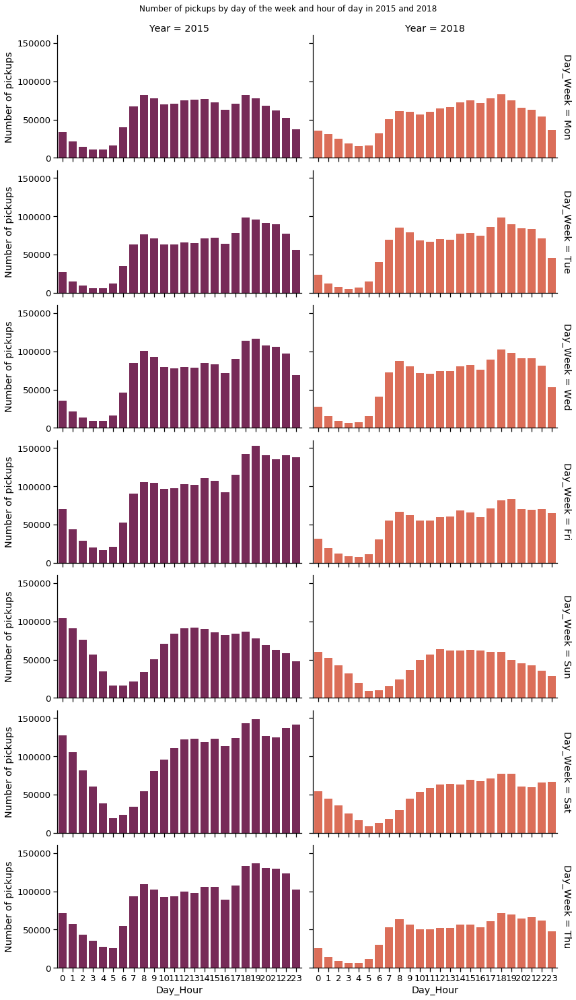

In [43]:
#Number of pickups
year=[2015,2018]

g = sns.FacetGrid(DF.groupBy("Year","Day_Week","Day_Hour").count()\
                    .orderBy("Day_Hour").toPandas(),row="Day_Week",\
                    aspect = 2, col = "Year", margin_titles=True, hue="Year",palette="rocket")
g.map(sns.barplot, "Day_Hour","count").set_ylabels("Number of pickups")
plt.subplots_adjust(top = 0.95)
g.fig.suptitle("Number of pickups by day of the week and hour of day in 2015 and 2018")


Text(0.5, 0.98, 'Average fare amount of a course by day of the week and hour of day in 2015 and 2018')

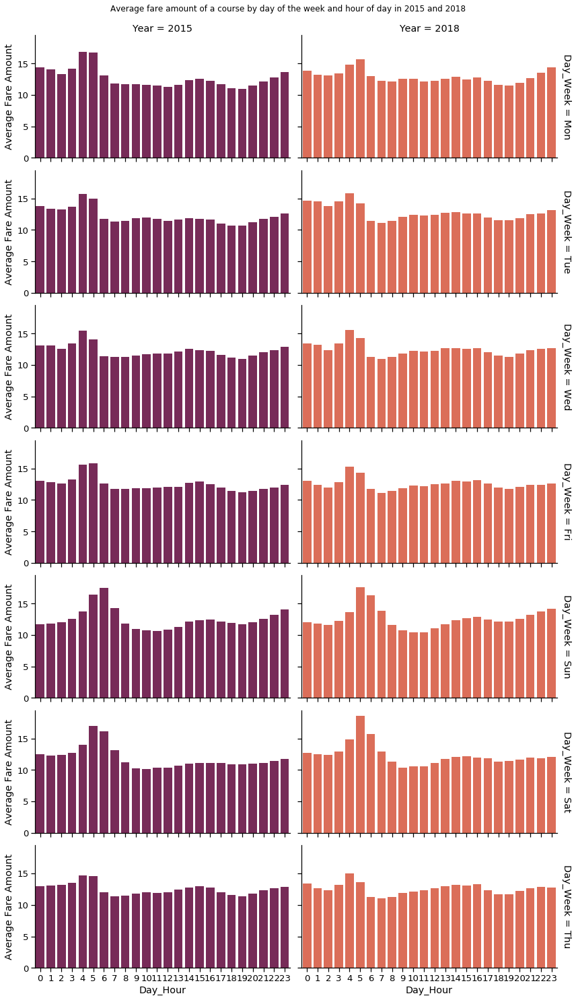

In [44]:
#Average fare
g = sns.FacetGrid(DF.groupBy("Year","Day_Week","Day_Hour").avg("fare_amount")\
                    .orderBy("Day_Hour").toPandas(),row="Day_Week", \
                    col="Year", aspect = 2, margin_titles=True, hue="Year",palette="rocket")
g.map(sns.barplot, "Day_Hour","avg(fare_amount)").set_ylabels("Average Fare Amount")
plt.subplots_adjust(top = 0.95)
g.fig.suptitle("Average fare amount of a course by day of the week and hour of day in 2015 and 2018")

Text(0.5, 0.98, 'Average trip duration by day of the week and hour of day in 2015 and 2018')

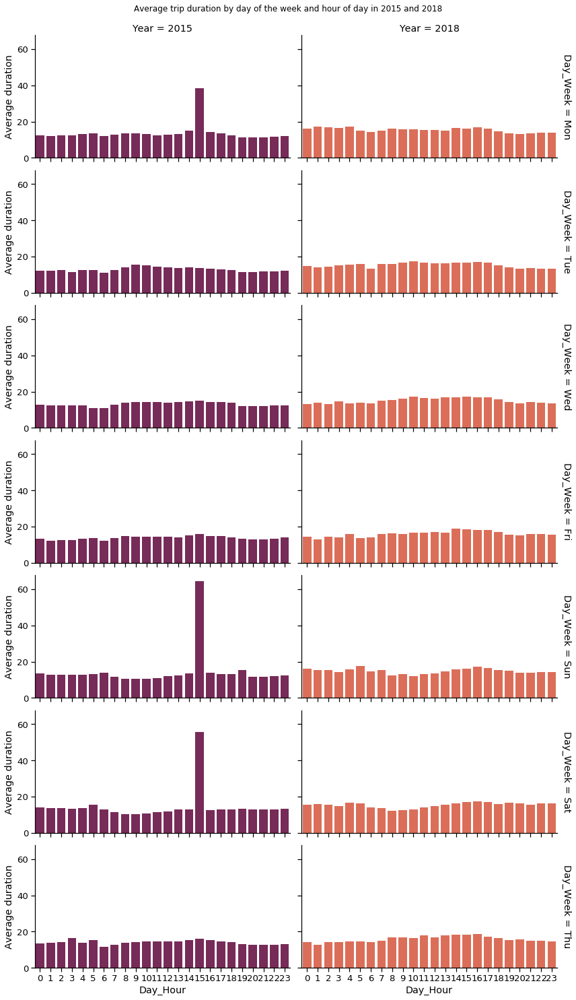

In [45]:
#Average trip duration
g = sns.FacetGrid(DF.groupBy("Year","Day_Week","Day_Hour").avg("Duration")\
                        .orderBy("Day_Hour").toPandas(),row="Day_Week",\
                  col="Year", aspect = 2, margin_titles=True, hue="Year",palette="rocket")
g.map(sns.barplot, "Day_Hour","avg(Duration)").set_ylabels("Average duration")
plt.subplots_adjust(top = 0.95)
g.fig.suptitle("Average trip duration by day of the week and hour of day in 2015 and 2018")

Text(0.5, 0.98, 'Average number of ongoing trips by day of the week and hour of day in 2015 and 2018')

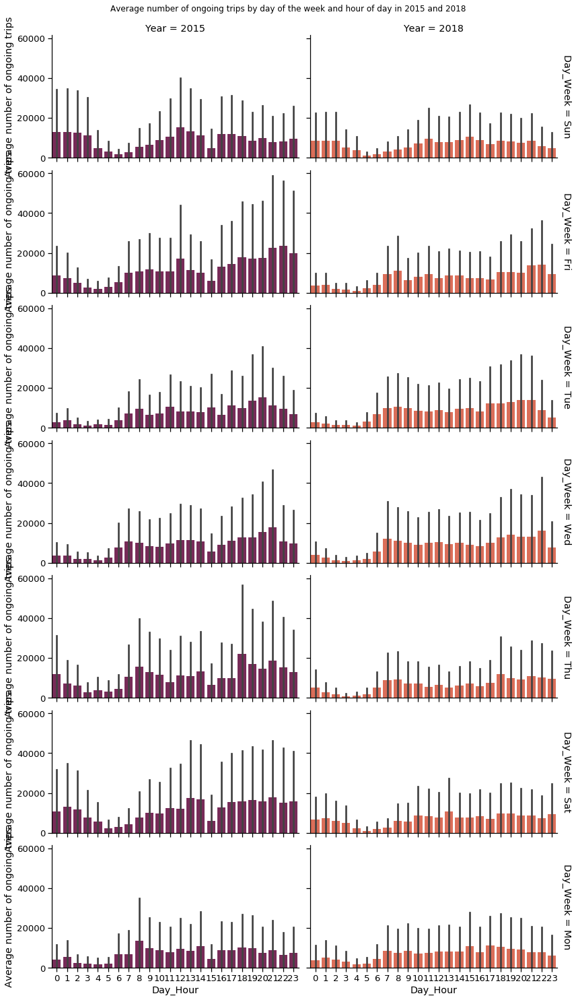

In [46]:
#Average number of ongoing trips
g = sns.FacetGrid(DF.groupBy("Year","Day_Week","Day_Hour",fn.hour("tpep_pickup_datetime"),\
                             fn.hour("tpep_dropoff_datetime")).count().orderBy("Day_Hour")\
                            .toPandas(),row="Day_Week", col = "Year",aspect = 2,\
                              margin_titles=True,hue="Year",palette="rocket")
g.map(sns.barplot, "Day_Hour","count").set_ylabels("Average number of ongoing trips")
plt.subplots_adjust(top = 0.95)
g.fig.suptitle("Average number of ongoing trips by day of the week and hour of day in 2015 and 2018")

## Rides to the airports

In order to find the longitude and lattitude of JFK and Newark airport as well as the longitude and magnitudes 
of Manhattan, you can use a service like [geojson.io](http://geojson.io/).
Plot the following time series, indexed the day of the week and hour of the day

1. Median duration of taxi trip leaving Midtown (Southern Manhattan) headed for JFK Airport
1. Median taxi duration of trip leaving from JFK Airport to Midtown (Southern Manhattan)

In [47]:
JFK_lon_min = -73.79422187805174
JFK_lon_max =  -73.77585411071777
JFK_lat_max = 40.65147128144057
JFK_lat_min = 40.639227866411176
New_lon_min = -74.18998718261719
New_lon_max = -74.17110443115234
New_lat_max = 40.69521661351714
New_lat_min = 40.685389433327266
SM_lon_max = -73.98983001708984
SM_lon_min = -74.00871276855469
SM_lat_max =  40.77976151788258
SM_lat_min = 40.700682761880564
LG_lon_max = -73.88915061950684
LG_lon_min = -73.8599681854248
LG_lat_max = 40.77638178482896
LG_lat_min = 40.764421348741976

JFK_ID = 132 # LocationID
SM_str = "Manhattan"

In [48]:
#Median duration of taxi trip from SM to JFK Airport indexed by the day of the week and hour of the day

In [49]:
SM_JFK_2015 = spark.sql(
    """SELECT 
        tpep_pickup_datetime, 
        tpep_dropoff_datetime,
        pickup_longitude,
        pickup_latitude,
        dropoff_longitude,
        dropoff_latitude
    FROM pqt2015F
    WHERE 
        pqt2015F.pickup_longitude >= {lon_min} 
        AND pqt2015F.pickup_longitude <= {lon_max} 
        AND pqt2015F.pickup_latitude >= {lat_min} 
        AND pqt2015F.pickup_latitude <= {lat_max}
        AND pqt2015F.dropoff_longitude >= {lon_min_} 
        AND pqt2015F.dropoff_longitude <= {lon_max_} 
        AND pqt2015F.dropoff_latitude >= {lat_min_} 
        AND pqt2015F.dropoff_latitude <= {lat_max_}""" \
                        .format(lon_min = SM_lon_min, 
                                lon_max = SM_lon_max, 
                                lat_max = SM_lat_max, 
                                lat_min = SM_lat_min,
                                lon_min_ = JFK_lon_min,
                                lon_max_ = JFK_lon_max,
                                lat_max_ = JFK_lat_max,
                                lat_min_ = JFK_lat_min)
)

SM_IDs = spark.createDataFrame(nybb[nybb["borough"] == "Manhattan"][['LocationID','borough']])
SM_IDs = SM_IDs.withColumnRenamed("LocationID", "PULocationID")

SM_JFK_2018 = spark.sql(
    """SELECT 
        tpep_pickup_datetime, 
        tpep_dropoff_datetime,
        PULocationID,
        DOLocationID
    FROM pqt2018
    WHERE 
        pqt2018.DOLocationID = {JFK}""" \
                        .format(JFK = JFK_ID)
)

SM_JFK_2015 = SM_JFK_2015.select("tpep_pickup_datetime", "tpep_dropoff_datetime")#.withColumn("Year", fn.lit(2015))

SM_JFK_2018 = SM_JFK_2018.join(broadcast(SM_IDs),
                               ['PULocationID'],
                               "right"
                              ).select("tpep_pickup_datetime", "tpep_dropoff_datetime")#.withColumn("Year", fn.lit(2018))
SM_JFK = SM_JFK_2015.union(SM_JFK_2018)

SM_JFK = SM_JFK.withColumn(
    "Duration", 
    (fn.col("tpep_dropoff_datetime").cast("long") - fn.col("tpep_pickup_datetime").cast("long"))/60
).withColumn(
    "Day", 
    fn.date_format(SM_JFK.tpep_pickup_datetime,'E')
).withColumn(
    "Day Number",
    fn.date_format(SM_JFK.tpep_pickup_datetime,'u')
).withColumn(
    "Hour",
    fn.date_format(SM_JFK.tpep_pickup_datetime,'HH')
).withColumn(
    "Year",
    fn.date_format(SM_JFK.tpep_pickup_datetime,'y')
).select(
    "Year",
    "Day",
    "Day Number",
    "Hour",
    "Duration"
)

In [50]:
window = Window.partitionBy(['Year', 'Day', 'Hour'])
SM_JFK = SM_JFK.withColumn('Mean Duration', fn.mean(SM_JFK['Duration']).over(window))

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23]), <a list of 24 Text xticklabel objects>)

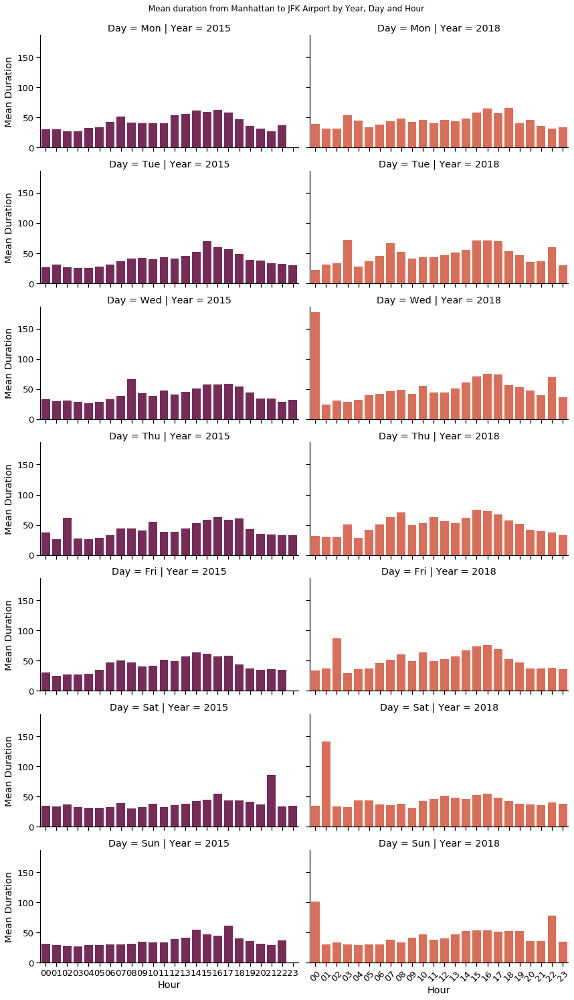

In [51]:
g = sns.FacetGrid(data = SM_JFK.select("Year", "Day", "Day Number","Hour", "Mean Duration").distinct().orderBy("Year", "Day Number", "Hour").toPandas(),
                  row = "Day",
                  col = "Year",
                  aspect = 2,
                  hue="Year",
                  palette="rocket"
                 )
g = g.map(sns.barplot, "Hour", "Mean Duration")
plt.subplots_adjust(top = 0.95)
g.fig.suptitle("Mean duration from Manhattan to JFK Airport by Year, Day and Hour")
plt.xticks(rotation=45)

In [52]:
#Median duration of taxi trip from JFK Airport to SM indexed by the day of the week and hour of the day

In [53]:
SM_JFK_2015 = spark.sql(
    """SELECT 
        tpep_pickup_datetime, 
        tpep_dropoff_datetime,
        pickup_longitude,
        pickup_latitude,
        dropoff_longitude,
        dropoff_latitude
    FROM pqt2015F
    WHERE 
        pqt2015F.pickup_longitude >= {lon_min} 
        AND pqt2015F.pickup_longitude <= {lon_max} 
        AND pqt2015F.pickup_latitude >= {lat_min} 
        AND pqt2015F.pickup_latitude <= {lat_max}
        AND pqt2015F.dropoff_longitude >= {lon_min_} 
        AND pqt2015F.dropoff_longitude <= {lon_max_} 
        AND pqt2015F.dropoff_latitude >= {lat_min_} 
        AND pqt2015F.dropoff_latitude <= {lat_max_}""" \
                        .format(lon_min = JFK_lon_min, 
                                lon_max = JFK_lon_max, 
                                lat_max = JFK_lat_max, 
                                lat_min = JFK_lat_min,
                                lon_min_ = SM_lon_min,
                                lon_max_ = SM_lon_max,
                                lat_max_ = SM_lat_max,
                                lat_min_ = SM_lat_min)
)

SM_IDs = spark.createDataFrame(nybb[nybb["borough"] == "Manhattan"][['LocationID','borough']])
SM_IDs = SM_IDs.withColumnRenamed("LocationID", "DOLocationID")

SM_JFK_2018 = spark.sql(
    """SELECT 
        tpep_pickup_datetime, 
        tpep_dropoff_datetime,
        PULocationID,
        DOLocationID
    FROM pqt2018
    WHERE 
        pqt2018.PULocationID = {JFK}""" \
                        .format(JFK = JFK_ID)
)

SM_JFK_2015 = SM_JFK_2015.select("tpep_pickup_datetime", "tpep_dropoff_datetime")#.withColumn("Year", fn.lit(2015))

SM_JFK_2018 = SM_JFK_2018.join(broadcast(SM_IDs),
                               ['DOLocationID'],
                               "right"
                              ).select("tpep_pickup_datetime", "tpep_dropoff_datetime")#.withColumn("Year", fn.lit(2018))

SM_JFK = SM_JFK_2015.union(SM_JFK_2018)

SM_JFK = SM_JFK.withColumn(
    "Duration", 
    (fn.col("tpep_dropoff_datetime").cast("long") - fn.col("tpep_pickup_datetime").cast("long"))/60
).withColumn(
    "Day", 
    fn.date_format(SM_JFK.tpep_pickup_datetime,'E')
).withColumn(
    "Day Number",
    fn.date_format(SM_JFK.tpep_pickup_datetime,'u')
).withColumn(
    "Hour",
    fn.date_format(SM_JFK.tpep_pickup_datetime,'HH')
).withColumn(
    "Year",
    fn.date_format(SM_JFK.tpep_pickup_datetime,'y')
).select(
    "Year",
    "Day",
    "Day Number",
    "Hour",
    "Duration"
).where((col("Year") == 2015) | (col("Year") == 2018))

In [54]:
window = Window.partitionBy(['Year', 'Day', 'Hour'])
SM_JFK = SM_JFK.withColumn('Mean Duration', fn.mean(SM_JFK['Duration']).over(window))

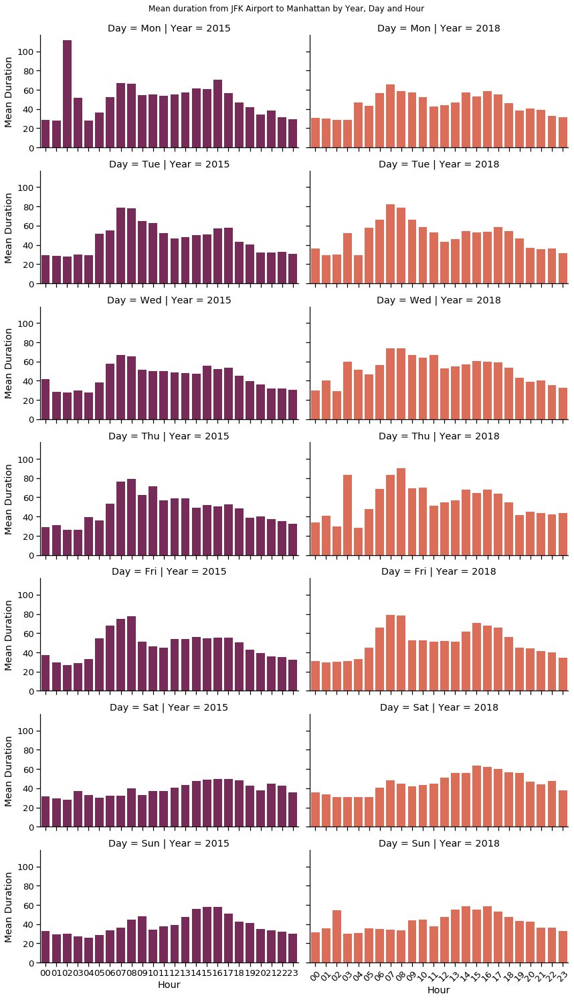

In [55]:
g = sns.FacetGrid(data = SM_JFK.select("Year", "Day", "Day Number","Hour", "Mean Duration").distinct().orderBy("Year", "Day Number", "Hour").toPandas(),
                  row = "Day",
                  col = "Year",
                  aspect = 2, 
                  hue="Year",
                  palette="rocket"
                 )
g = g.map(sns.barplot, "Hour", "Mean Duration")
plt.subplots_adjust(top = 0.95)
g.fig.suptitle("Mean duration from JFK Airport to Manhattan by Year, Day and Hour")
plt.xticks(rotation=45);

## Geographic information

For this, you will need to find tools to display maps and to build choropeth maps.
We let you look and find relevant tools to do this.

1. Build a heatmap where color is a function of
    1. number of `pickups`
    2. number of `dropoffs`
    3. number of `pickups` with dropoff at some airport (JFK, LaGuardia, Newark)
2. Build a choropeth map where color is a function of
    1. number of pickups in the area
    1. ratio of number of payments by card/number of cash payments for pickups in the area
    2. ratio of total fare/trip duration for dropoff in the area
3. Build an interactive chorophet with a slider allowing the user to select an `hour of day` and where the color is a function of
    1. average number of dropoffs in the area during that hour the day
    2. average ratio of tip over total fare amount for pickups in the area at given hour of the day

In [56]:
import geoplot as gplt
import geoplot.crs as gcrs
import mplleaflet
import fiona

### 1. Build a heatmap where color is a function of

#### 1. number of `pickups`

In [57]:
pd_1 = pqt2015F.sample(False, 0.005, None).select("pickup_longitude", "pickup_latitude").toPandas()

In [58]:
extent = (
    lon_min_,
    lat_min_,
    lon_max_,
    lat_max_
)

In [59]:
geometry = [Point(xy) for xy in zip(pd_1["pickup_longitude"], pd_1["pickup_latitude"])]
crs = CRS('EPSG:3857')
gdf_pick = gpd.GeoDataFrame(
    None, \
    crs = crs, \
    geometry = geometry, \
    )

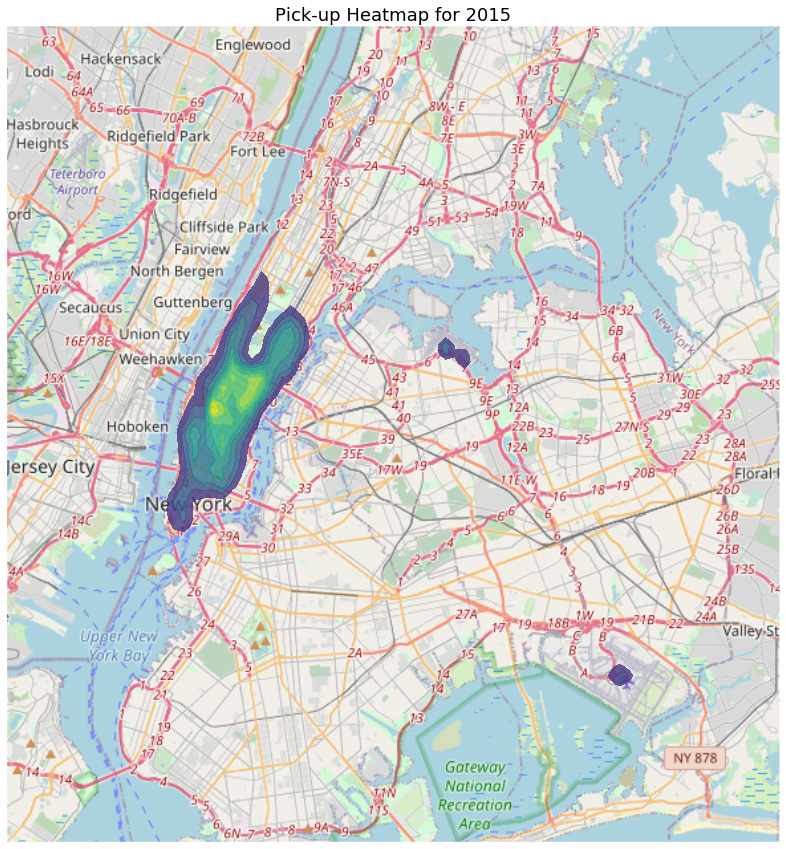

In [60]:
ax = gplt.kdeplot(
    gdf_pick,
    cmap='viridis', projection=gcrs.WebMercator(), figsize=(15, 15),
    shade=True,
    #shade_lowest = True,
    extent = extent,
    alpha = 0.8
)

#gplt.pointplot(gdf_pick, s=1, color='black', ax=ax);
gplt.webmap(gdf_pick, ax=ax, zoom=11, extent = extent);
plt.title('Pick-up Heatmap for 2015', fontsize=18)
fig = plt.gcf();
#mplleaflet.show(fig)

#### 2. number of `dropoffs`

In [61]:
pd_1 = pqt2015F.sample(False, 0.005, None).select("dropoff_longitude", "dropoff_latitude").toPandas()
geometry = [Point(xy) for xy in zip(pd_1["dropoff_longitude"], pd_1["dropoff_latitude"])]
crs = CRS('EPSG:3857')
gdf_pick = gpd.GeoDataFrame(
    None, \
    crs = crs, \
    geometry = geometry, \
    )

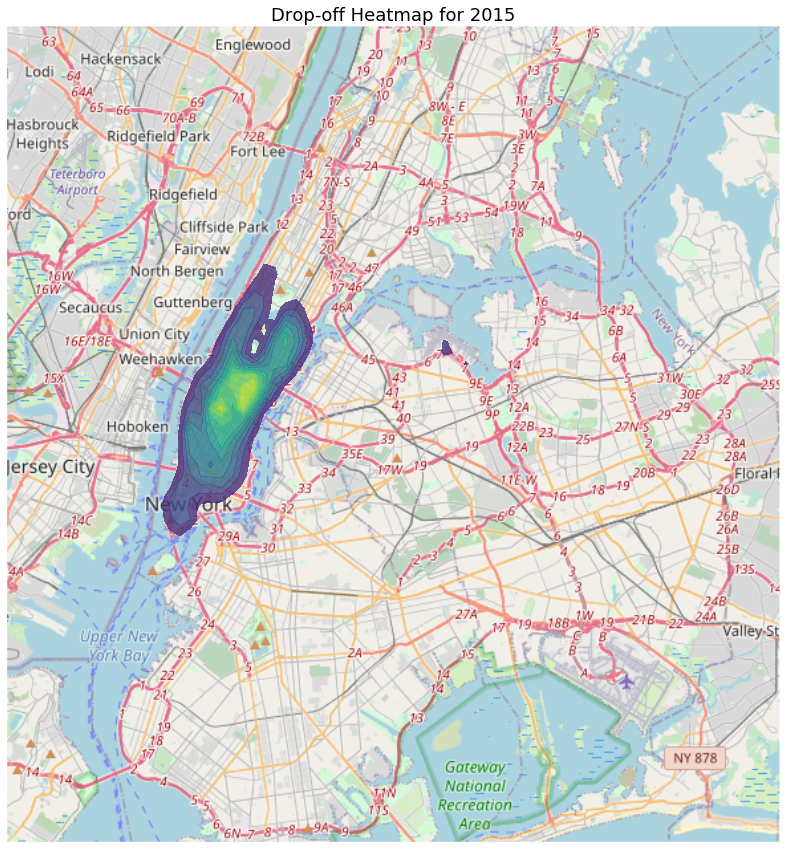

In [62]:
fig = None
ax = gplt.kdeplot(
    gdf_pick, cmap='viridis', projection=gcrs.WebMercator(), figsize=(15, 15),
    shade=True,
    #shade_lowest = True,
    extent = extent,
    alpha = 0.8
)

#gplt.pointplot(gdf_pick, s=1, color='black', ax=ax);
gplt.webmap(
    gdf_pick,
    ax=ax,
    zoom=11,
    extent = extent
);
plt.title('Drop-off Heatmap for 2015', fontsize=18)
fig = plt.gcf()

#mplleaflet.show(fig)

#### 3 number of pickups with dropoff at some airport (JFK, LaGuardia, Newark)

In [63]:
ap = spark.sql(
    """SELECT 
        pickup_longitude,
        pickup_latitude,
        dropoff_longitude,
        dropoff_latitude
    FROM pqt2015F
    WHERE 
        (pqt2015F.dropoff_longitude >= {lon_min_1} 
        AND pqt2015F.dropoff_longitude <= {lon_max_1} 
        AND pqt2015F.dropoff_latitude >= {lat_min_1} 
        AND pqt2015F.dropoff_latitude <= {lat_max_1})
        OR
        (pqt2015F.dropoff_longitude >= {lon_min_2} 
        AND pqt2015F.dropoff_longitude <= {lon_max_2} 
        AND pqt2015F.dropoff_latitude >= {lat_min_2} 
        AND pqt2015F.dropoff_latitude <= {lat_max_2})
        OR 
        (pqt2015F.dropoff_longitude >= {lon_min_3} 
        AND pqt2015F.dropoff_longitude <= {lon_max_3} 
        AND pqt2015F.dropoff_latitude >= {lat_min_3} 
        AND pqt2015F.dropoff_latitude <= {lat_max_3})""" \
    .format(
        lon_min_1 = New_lon_min, 
        lon_max_1 = New_lon_max, 
        lat_max_1 = New_lat_max, 
        lat_min_1 = New_lat_min,
        lon_min_2 = JFK_lon_min,
        lon_max_2 = JFK_lon_max,
        lat_max_2 = JFK_lat_max,
        lat_min_2 = JFK_lat_min,
        lon_min_3 = LG_lon_min,
        lon_max_3 = LG_lon_max,
        lat_max_3 = LG_lat_max,
        lat_min_3 = LG_lat_min,
    )
)

In [64]:
pd_1 = ap.select("pickup_longitude", "pickup_latitude").toPandas()
geometry = [Point(xy) for xy in zip(pd_1["pickup_longitude"], pd_1["pickup_latitude"])]
crs = CRS('EPSG:3857')
gdf_pick = gpd.GeoDataFrame(
    None, \
    crs = crs, \
    geometry = geometry, \
    )

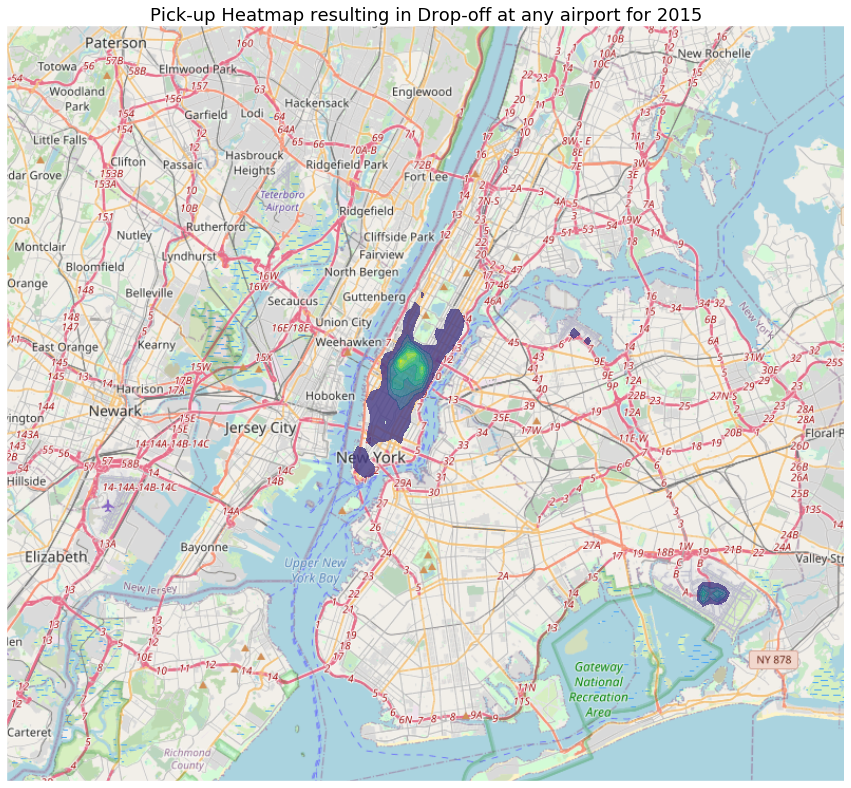

In [65]:
fig = None
ax = gplt.kdeplot(
    gdf_pick, cmap='viridis', projection=gcrs.WebMercator(), figsize=(15, 15),
    shade=True,
    #shade_lowest = True,
    extent = extent,
    alpha = 0.8
)

#gplt.pointplot(gdf_pick, s=1, color='black', ax=ax);
gplt.webmap(
    gdf_pick,
    ax=ax,
    zoom=11,
    #extent = extent
);
plt.title('Pick-up Heatmap resulting in Drop-off at any airport for 2015', fontsize=18)
fig = plt.gcf()

#mplleaflet.show(fig)

In [66]:
del pd_1

### 2. Build a choropeth map where color is a function of


#### 1. number of pickups in the area


In [67]:
PU_count = spark.sql(
    """SELECT COUNT(*) AS count, query.PULocationID
    FROM (
    SELECT DISTINCT(PULocationID) FROM pqt2018
    ) AS query, pqt2018
    WHERE pqt2018.PULocationID = query.PULocationID
    GROUP BY query.PULocationID""")

PU_count = PU_count.select(col("PULocationID").alias("LocationID"), col("count"))

PU_count_pd = PU_count.toPandas()

nybb_PU = nybb.merge(PU_count_pd, on = "LocationID")

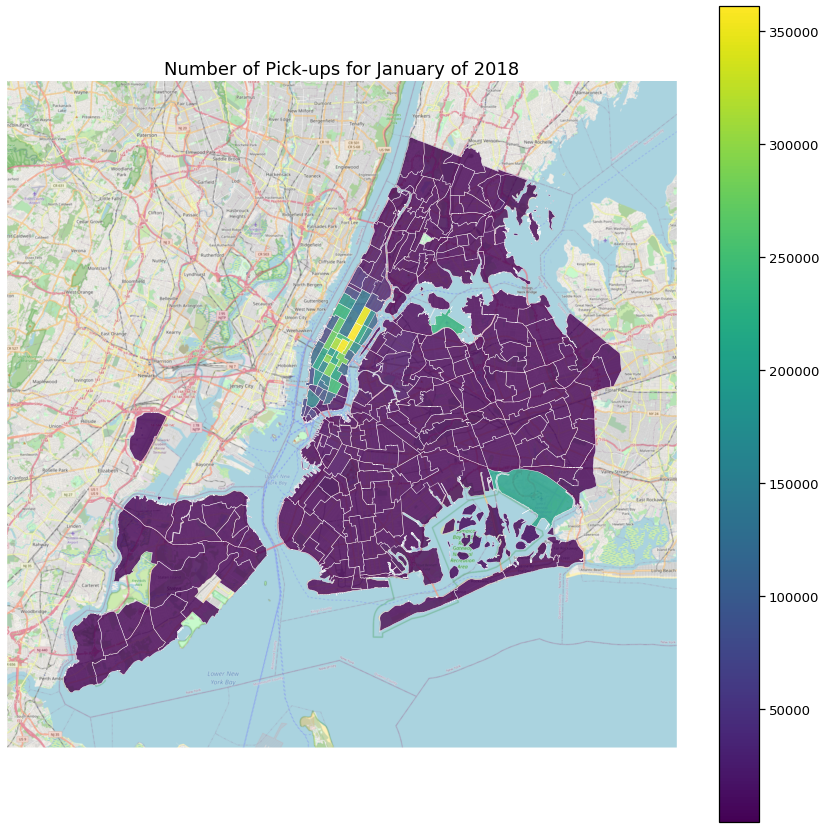

In [68]:
ax = gplt.choropleth(
    nybb_PU,
    hue='count',
    cmap='viridis', linewidth=0.5,
    edgecolor='white',
    legend=True,
    projection=gcrs.WebMercator(),
    figsize=(15, 15),
    alpha = 0.8
)

#gplt.pointplot(gdf_pick, s=1, color='black', ax=ax);
gplt.webmap(
    nybb_PU,
    ax=ax,
    zoom=12,
    #extent = extent
);
plt.title('Number of Pick-ups for January of 2018', fontsize=18)
fig = plt.gcf()

#### 2. ratio of number of payments by card/number of cash payments for pickups in the area


In [69]:
SM_IDs = spark.createDataFrame(nybb[nybb["borough"] == "Manhattan"][['LocationID','borough']])
SM_IDs = SM_IDs.withColumnRenamed("LocationID", "PULocationID")

SM_JFK_2018 = spark.sql(
    """
    SELECT 
        tpep_pickup_datetime, 
        tpep_dropoff_datetime,
        PULocationID,
        DOLocationID,
        Payment_type,
        Fare_amount
    FROM pqt2018
    """
)

SM_JFK = SM_JFK_2018

SM_JFK = SM_JFK.groupBy('PULocationID', 'Payment_type') \
    .count() \
    .where((col("Payment_type") == 1) | (col("Payment_type") == 2))
SM1 = SM_JFK.where((col("Payment_type") == 1)).withColumn('1', col('count'))
SM2 = SM_JFK.where((col("Payment_type") == 2)).withColumn('2', col('count'))
SM_JFK = SM1.join(SM2, ['PULocationID']).select("PULocationID", "1", "2").orderBy('PULocationID')
SM_JFK = SM_JFK.withColumn("Ratio Card/Cash", col("1") / col("2"))
SM_JFK = SM_JFK.select(col("PULocationID").alias("LocationID"), col("Ratio Card/Cash"))
pddf = nybb.merge(SM_JFK.toPandas(), on = "LocationID")

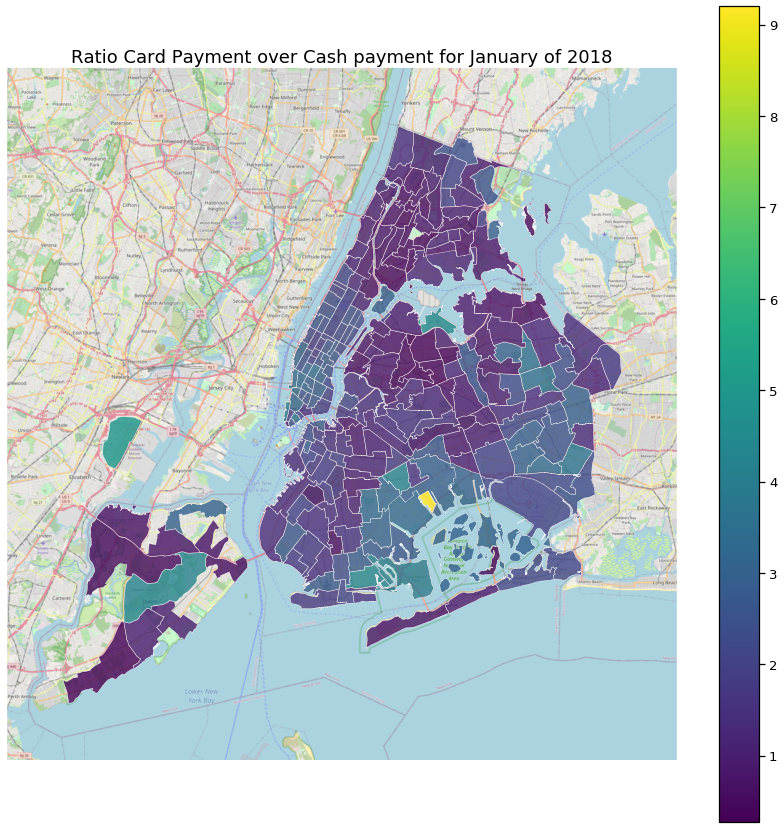

In [70]:
ax = gplt.choropleth(
    pddf,
    hue='Ratio Card/Cash',
    cmap='viridis', linewidth=0.5,
    edgecolor='white',
    legend=True,
    projection=gcrs.WebMercator(),
    figsize=(15, 15),
    alpha = 0.8
)

gplt.webmap(
    pddf,
    ax=ax,
    zoom=12,
    #extent = extent
);
plt.title('Ratio Card Payment over Cash payment for January of 2018', fontsize=18)
fig = plt.gcf()

#### 3. ratio of total fare/trip duration for dropoff in the area

In [71]:
SM_IDs = spark.createDataFrame(nybb[nybb["borough"] == "Manhattan"][['LocationID','borough']])
SM_IDs = SM_IDs.withColumnRenamed("LocationID", "PULocationID")

SM_JFK_2018 = spark.sql(
    """
    SELECT 
        tpep_pickup_datetime, 
        tpep_dropoff_datetime,
        PULocationID,
        DOLocationID,
        Payment_type,
        Total_amount
    FROM pqt2018
    """
)

SM_JFK = SM_JFK_2018

SM_JFK = SM_JFK \
.withColumn(
    "Duration", 
    (fn.col("tpep_dropoff_datetime").cast("long") - fn.col("tpep_pickup_datetime").cast("long"))/60
).withColumn(
    "Ratio",
    col("Total_amount") / col("Duration")
).select("DOLocationID", "Ratio")

SM_JFK = SM_JFK.groupBy('DOLocationID') \
    .avg()
SM_JFK = SM_JFK.select(col("DOLocationID").alias("LocationID"), col("avg(Ratio)").alias("Ratio"))
pddf = nybb.merge(SM_JFK.toPandas(), on = "LocationID")

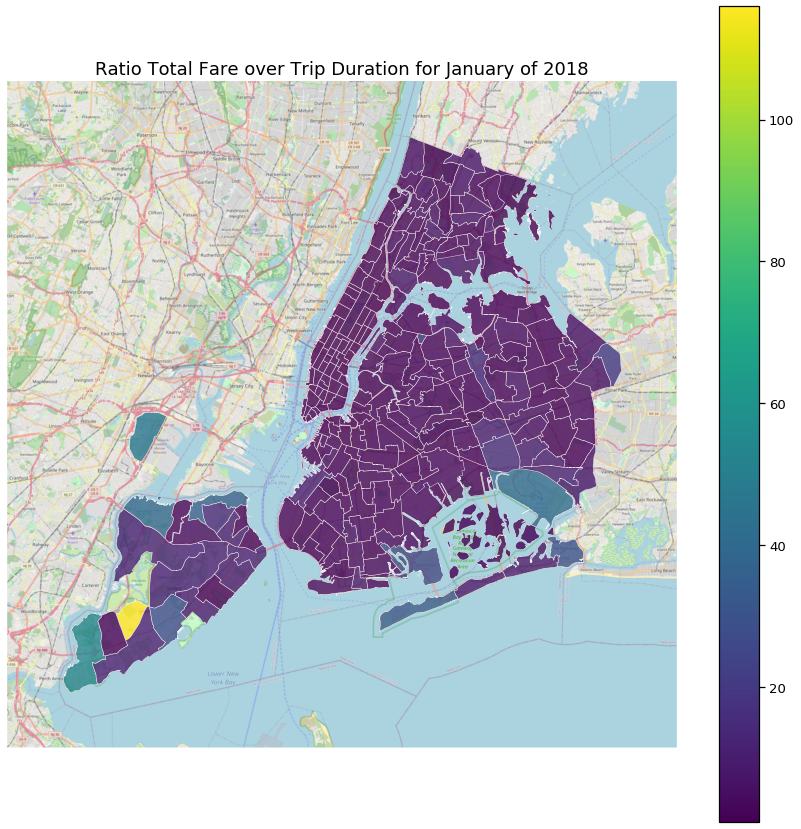

In [72]:
ax = gplt.choropleth(
    pddf,
    hue='Ratio',
    cmap='viridis', linewidth=0.5,
    edgecolor='white',
    legend=True,
    projection=gcrs.WebMercator(),
    figsize=(15, 15),
    alpha = 0.8
)

gplt.webmap(
    pddf,
    ax=ax, 
    zoom=12, 
    #extent = extent
);
plt.title('Ratio Total Fare over Trip Duration for January of 2018', fontsize=18)
fig = plt.gcf()

### 3. Build an interactive chorophet with a slider allowing the user to select an hour of day and where the color is a function of ...

In [73]:


from __future__ import print_function
from ipywidgets import interact, interactive, fixed, interact_manual
import ipywidgets as widgets



In [74]:
SM_IDs = spark.createDataFrame(nybb[nybb["borough"] == "Manhattan"][['LocationID','borough']])
SM_IDs = SM_IDs.withColumnRenamed("LocationID", "PULocationID")

SM_JFK_2018 = spark.sql(
    """
    SELECT 
        tpep_pickup_datetime, 
        tpep_dropoff_datetime,
        PULocationID,
        DOLocationID,
        Total_amount,
        Tip_amount
    FROM pqt2018
    """
)

SM_JFK = SM_JFK_2018

SM_JFK = SM_JFK \
.withColumn(
    "Ratio_tip_fare",
    col("Tip_amount") / col("Total_amount")
).withColumn(
    "PUHour",
    fn.date_format(SM_JFK.tpep_pickup_datetime,'H').cast("long")
).withColumn(
    "DOHour",
    fn.date_format(SM_JFK.tpep_dropoff_datetime,'H').cast("long")
).withColumn(
    "Day Number",
    fn.date_format(SM_JFK.tpep_pickup_datetime,'u')
)
        
SM_1 = SM_JFK \
.withColumn(
    "Hour",
    col("DOHour")
).withColumn(
    "LocationID",
    col("DOLocationID")
).withColumn(
    "Date",
    col("tpep_dropoff_datetime")
).select(
    "Hour", 
    "LocationID",
    "Date"
).groupBy(
    "Hour", 
    "LocationID",
    "Date"
).count() \
.groupBy(
    "Hour", 
    "LocationID"
).avg()\
.withColumn(
    "Average DropOff",
    col("avg(count)")
).select("Hour", "LocationID", "Average DropOff")

SM_2 = SM_JFK \
.withColumn(
    "Hour",
    col("PUHour")
).withColumn(
    "LocationID",
    col("PULocationID")
).withColumn(
    "Date",
    col("tpep_dropoff_datetime")
).select(
    "Hour", 
    "LocationID",
    "Date",
    "Ratio_tip_fare",
).groupBy(
    "Hour",
    "LocationID"
).avg() \
.withColumn(
    "Average Ratio",
    col("avg(Ratio_tip_fare)")
).select("Hour", "LocationID", "Average Ratio")

SM_JFK = SM_1.join(SM_2, ['Hour', 'LocationID'])

pddf = nybb.merge(
    SM_JFK.toPandas(),
    on = "LocationID",
    how="left"
)[[
    "LocationID", 
    "zone", 
    "borough", 
    "Hour", 
    "geometry", 
    "Average DropOff", 
    "Average Ratio"
]]

SM_1.unpersist()
SM_2.unpersist()

DataFrame[Hour: bigint, LocationID: int, Average Ratio: double]

In [75]:
pddf = nybb.merge(SM_JFK.toPandas(), on = "LocationID")

In [76]:
pddf = pddf[pddf.Hour.notnull()]

In [77]:
selection = {
    "Average Dropoff Number": "Average DropOff",
    "Average Tip/Fare Ratio": "Average Ratio",
}

def test(hour, sel) :
    
    ax = gplt.choropleth(
        pddf.loc[pddf['Hour'] == hour],
        hue=selection[sel],
        cmap='viridis',
        linewidth=0.5,
        edgecolor='white',
        legend=True,
        projection=gcrs.WebMercator(),
        alpha = 0.8,
        figsize=(12, 12),
    )

    p = gplt.webmap(
        pddf,
        ax=ax, 
        zoom=12, 
        #extent = extent
    ); 
    
    plt.title(f'{sel} in an area at {hour}h for January of 2018', fontsize=18)
    fig = plt.gcf()
    
interact(
    test,
    hour = widgets.IntSlider(
        min=0, 
        max=23, 
        step=1, 
        value=12,
        description='Hour:'
    ),
    sel = widgets.Dropdown(
        options= [
            'Average Dropoff Number', 
            'Average Tip/Fare Ratio', 
        ],
        value='Average Dropoff Number',
        description='Selection:',
        disabled=False
    )
)


interactive(children=(IntSlider(value=12, description='Hour:', max=23), Dropdown(description='Selection:', opt…

<function __main__.test(hour, sel)>